In [1]:
import PIL
from diffusers.utils import make_image_grid
import torch
from diffusers import StableDiffusion3Pipeline
from src.customized_pipe import TI2I_StableDiffusion3Pipeline
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "2,3"
# pipe = Customized_StableDiffusion3Pipeline.from_pretrained("stabilityai/stable-diffusion-3-medium-diffusers", torch_dtype=torch.float16)
# pipe = Customized_StableDiffusion3Pipeline.from_pretrained("stabilityai/stable-diffusion-3-medium-diffusers",
#                                                             torch_dtype=torch.float16,
#                                                             device_map="balanced")
pipe = TI2I_StableDiffusion3Pipeline.from_pretrained("stabilityai/stable-diffusion-3.5-large",
                                                            torch_dtype=torch.float16,
                                                            device_map="balanced")

/nfs/home/bluedyee/miniconda3/envs/tfti2i/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Loading pipeline components...:  44%|████▍     | 4/9 [00:01<00:01,  3.19it/s]


KeyboardInterrupt: 

100%|██████████| 28/28 [01:48<00:00,  3.88s/it]


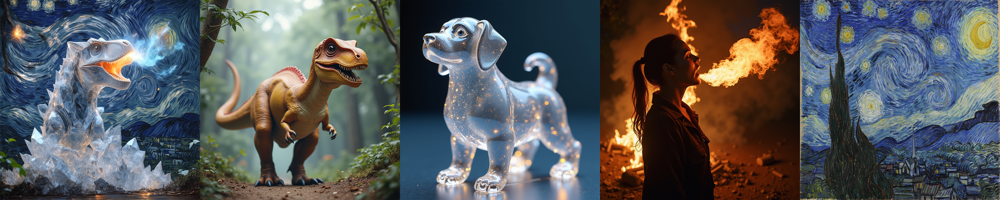

In [4]:
from src.attn_processor import TI2I_JointAttnProcessor2_0_multi
obj_prompt = "a dinosaur"
tex_prompt = "crystal"
act_prompt = "breathing fire"
bg_prompt = "Starry Night"

main_prompt=f"{obj_prompt} with texture of {tex_prompt} doing {act_prompt} in {bg_prompt}"
sub_prompts=[obj_prompt, tex_prompt, act_prompt,bg_prompt]
refer_images=[PIL.Image.open("refer_data/A dinosaur.png").resize((1024,1024)),
              PIL.Image.open("refer_data/crystal dog.png").resize((1024,1024)),
              PIL.Image.open("refer_data/breathing fire.png").resize((1024,1024)),
              PIL.Image.open("refer_data/ood_starry.jpg").resize((1024,1024)),
              ]


layer_count = 0
attn_processors = []
def iter_net(net):
    global layer_count
    for child in net.children():
        if "Attention" in child.__class__.__name__:
            child.processor = TI2I_JointAttnProcessor2_0_multi(layer=layer_count, contextual_replace=True,
                                                            wta_control_signal={"on":True,
                                                                                "hyper_parameter":{
                                                                                                "wta_weight":[1, 1, 1,1],
                                                                                                "cross2ref":True,
                                                                                                "wta_shift":[0, 0, 0,0],
                                                                                                "wta_cross":False
                                                                                                },
                                                                                "debug":False},
                                                            ref_control_signal={"on":True,
                                                                                "ref_idxs":[0,1,2,3], 
                                                                                "control_type":"main_context",
                                                                                "debug":False,
                                                                                "control_layers":[i for i in range(25,40)],
                                                                                "hyper_parameter":{}},
                                                                                )
            attn_processors.append(child.processor)
            layer_count += 1
        iter_net(child)

iter_net(pipe.transformer)

torch.manual_seed(0)
pipe.enable_attention_slicing()

switch_images = pipe.img2img_multi(
images=refer_images,
prompt_a=main_prompt,
prompt_b=sub_prompts,
negative_prompt="",
num_inference_steps=28,
guidance_scale=5,
strength=1,
height=1024,
width=1024,
)
make_image_grid(switch_images, rows=1, cols=len(switch_images))